## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_60"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 60


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6504
Epoch 11 Validation Loss: 0.6649
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6102
Epoch 21 Validation Loss: 0.6520
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5748
Epoch 31 Validation Loss: 0.6473
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5460
Epoch 41 Validation Loss: 0.6469
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_60/loss_history.json


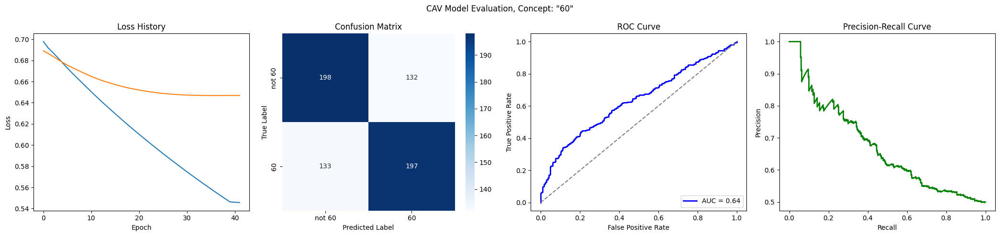

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6868
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6142
Epoch 11 Validation Loss: 0.6945
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_60/loss_history.json


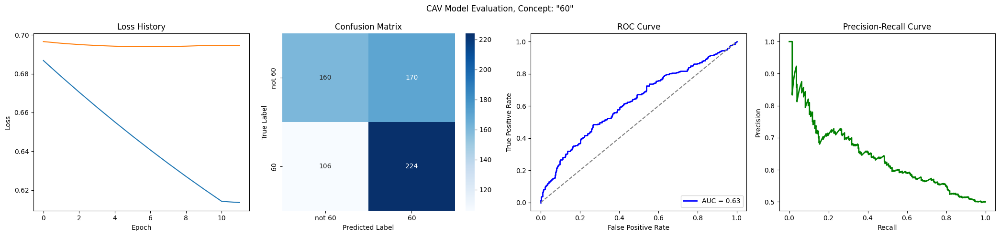

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6465
Epoch 11 Validation Loss: 0.6706
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6051
Epoch 21 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5692
Epoch 31 Validation Loss: 0.6444
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5384
Epoch 41 Validation Loss: 0.6381
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5115
Epoch 51 Validation Loss: 0.6347
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4878
Epoch 61 Validation Loss: 0.6329
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

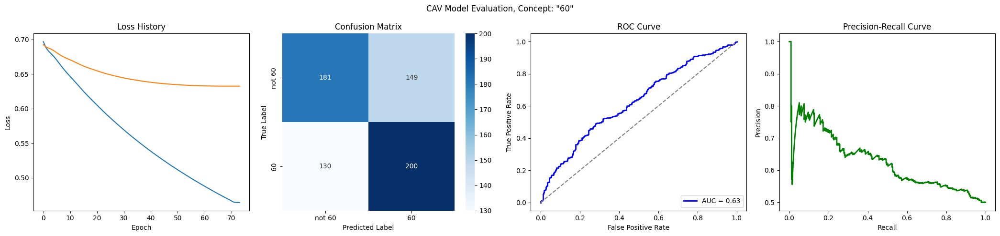

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6247
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_60/loss_history.json


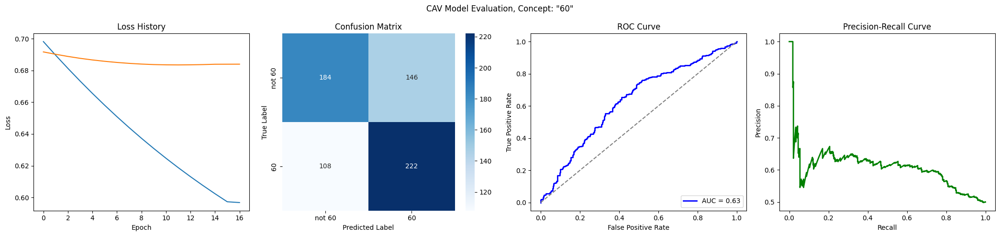

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6331
Epoch 11 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5847
Epoch 21 Validation Loss: 0.6551
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5445
Epoch 31 Validation Loss: 0.6461
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5106
Epoch 41 Validation Loss: 0.6419
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4815
Epoch 51 Validation Loss: 0.6408
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/singer_age_decade_60/loss_history.json


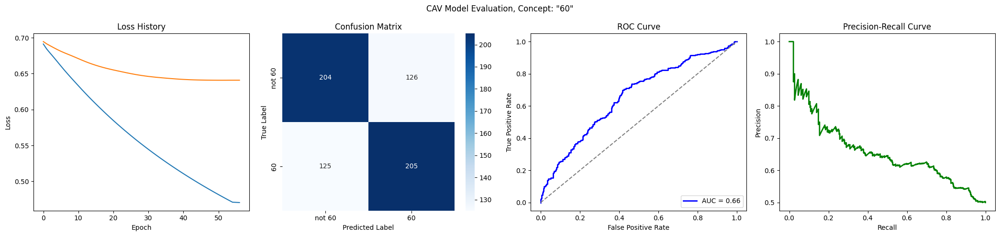

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_60/loss_history.json


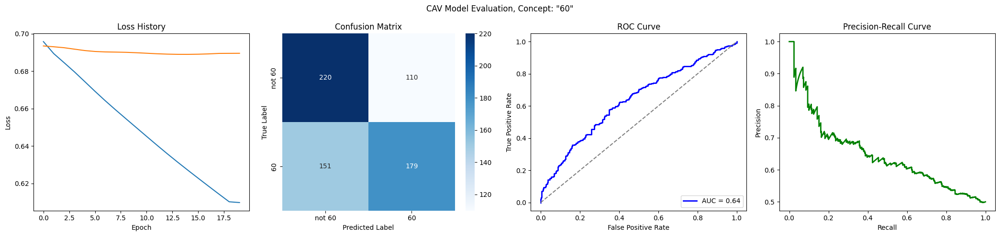

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6435
Epoch 11 Validation Loss: 0.6638
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5977
Epoch 21 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5588
Epoch 31 Validation Loss: 0.6257
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5256
Epoch 41 Validation Loss: 0.6155
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4969
Epoch 51 Validation Loss: 0.6088
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4718
Epoch 61 Validation Loss: 0.6045
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

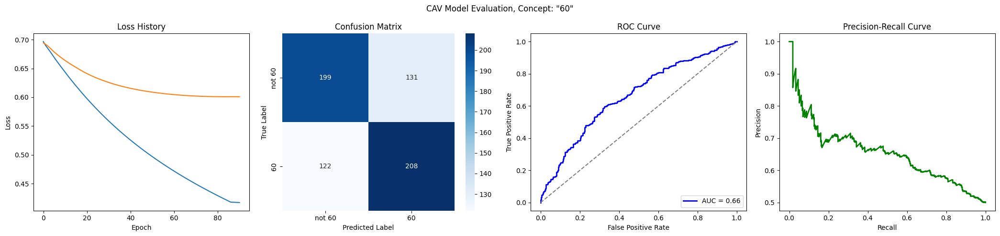

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6226
Epoch 11 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5702
Epoch 21 Validation Loss: 0.6387
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5287
Epoch 31 Validation Loss: 0.6223
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4937
Epoch 41 Validation Loss: 0.6087
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4632
Epoch 51 Validation Loss: 0.5975
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4361
Epoch 61 Validation Loss: 0.5888
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

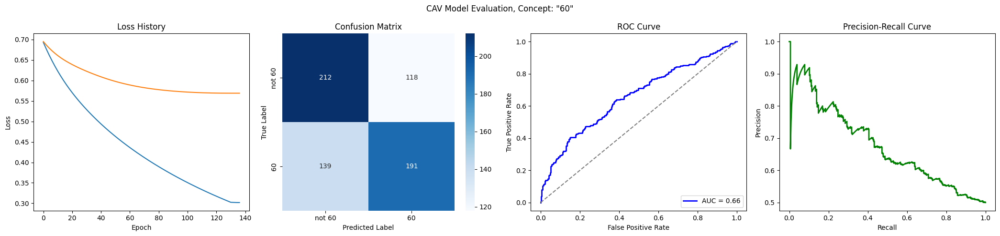

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_60/loss_history.json


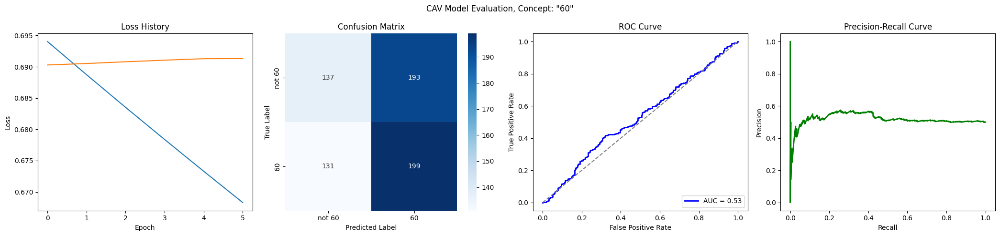

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6368
Epoch 11 Validation Loss: 0.6669
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5889
Epoch 21 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5498
Epoch 31 Validation Loss: 0.6476
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5172
Epoch 41 Validation Loss: 0.6465
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_60/loss_history.json


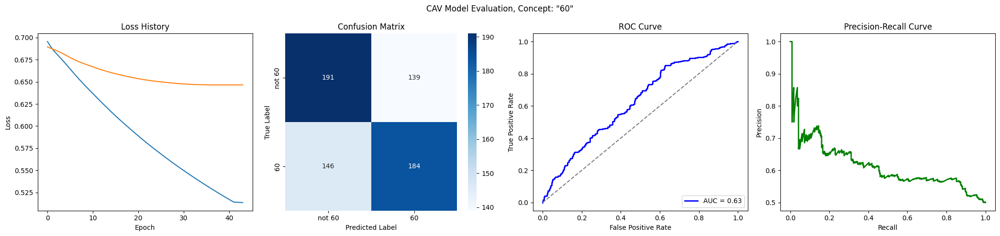

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6886
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6332
Epoch 11 Validation Loss: 0.6859
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5856
Epoch 21 Validation Loss: 0.6837
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_60/loss_history.json


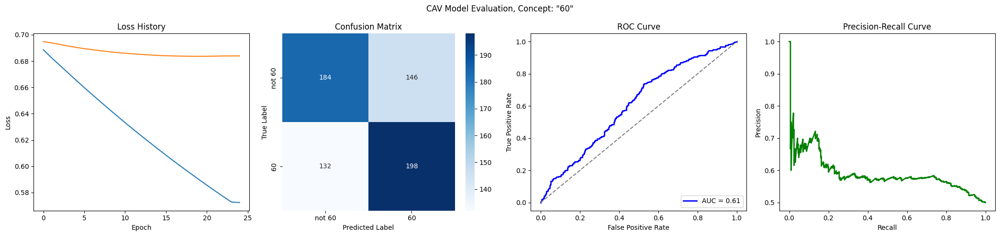

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6778
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5934
Epoch 21 Validation Loss: 0.6669
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5538
Epoch 31 Validation Loss: 0.6598
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5194
Epoch 41 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4891
Epoch 51 Validation Loss: 0.6551
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_60/loss_history.json


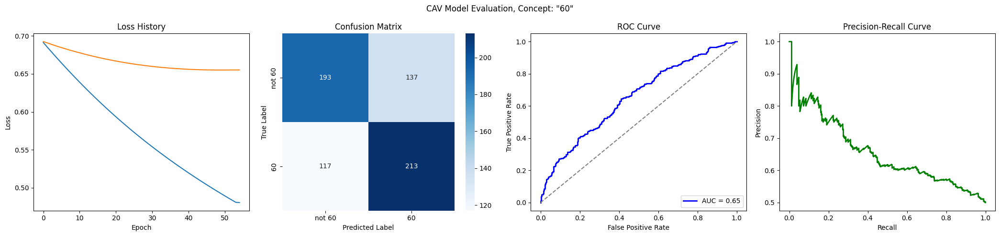

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6236
Epoch 11 Validation Loss: 0.6681
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5682
Epoch 21 Validation Loss: 0.6508
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5244
Epoch 31 Validation Loss: 0.6394
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4881
Epoch 41 Validation Loss: 0.6319
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4572
Epoch 51 Validation Loss: 0.6271
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4304
Epoch 61 Validation Loss: 0.6242
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

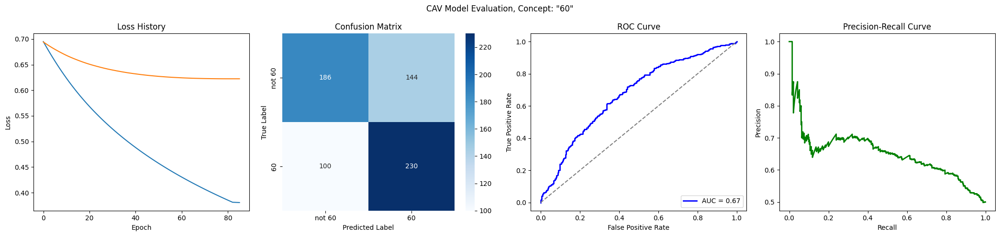

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_60/loss_history.json


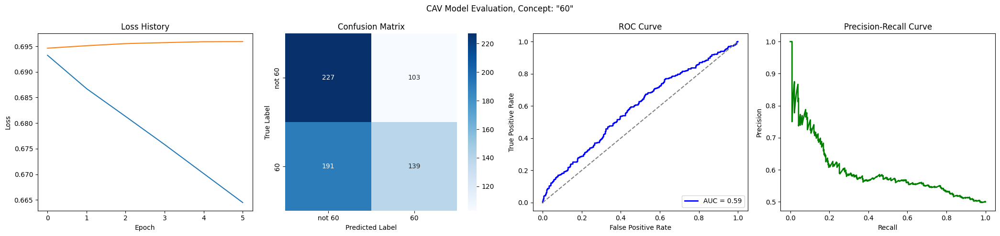

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.6965
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6552
Epoch 11 Validation Loss: 0.6715
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6175
Epoch 21 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5843
Epoch 31 Validation Loss: 0.6486
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5547
Epoch 41 Validation Loss: 0.6462
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_60/loss_history.json


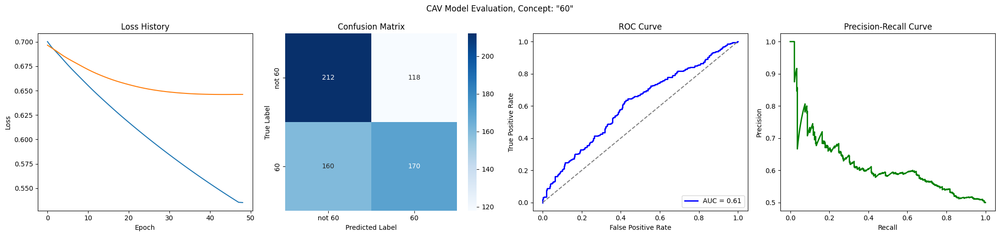

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6228
Epoch 11 Validation Loss: 0.6690
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5700
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_60/loss_history.json


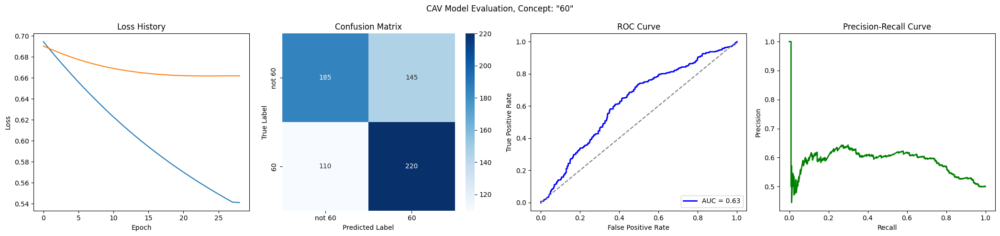

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6973
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6378
Epoch 11 Validation Loss: 0.6899
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5906
Epoch 21 Validation Loss: 0.6855
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5506
Epoch 31 Validation Loss: 0.6831
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5161
Epoch 41 Validation Loss: 0.6820
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4859
Epoch 51 Validation Loss: 0.6818
Early stopping at epoch 53
Loss history saved to trainings/singer_age_decade_60/loss_history.json


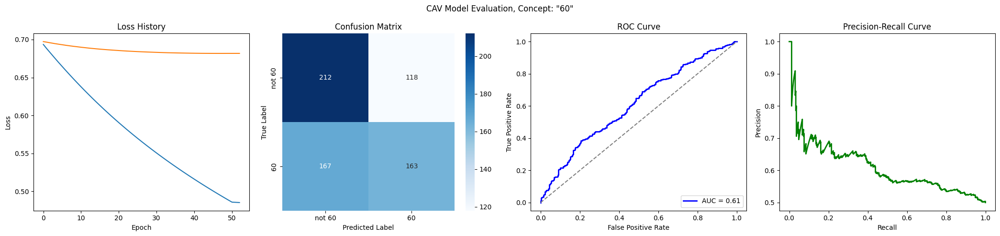

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7039
Epoch 1 Validation Loss: 0.6976
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6471
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5991
Epoch 21 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5579
Epoch 31 Validation Loss: 0.6483
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5221
Epoch 41 Validation Loss: 0.6407
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4907
Epoch 51 Validation Loss: 0.6367
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4628
Epoch 61 Validation Loss: 0.6352
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 70
Los

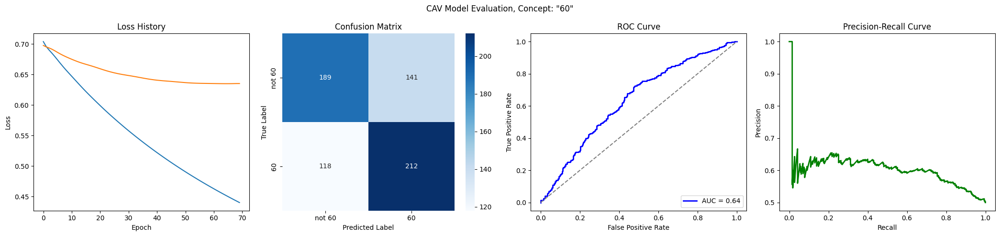

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6484
Epoch 11 Validation Loss: 0.6751
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6073
Epoch 21 Validation Loss: 0.6633
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5718
Epoch 31 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5405
Epoch 41 Validation Loss: 0.6479
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5126
Epoch 51 Validation Loss: 0.6433
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4875
Epoch 61 Validation Loss: 0.6405
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

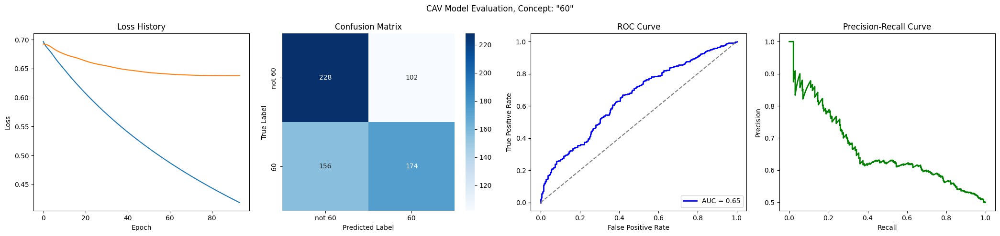

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6855
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6314
Epoch 11 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5865
Epoch 21 Validation Loss: 0.6899
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5478
Epoch 31 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5138
Epoch 41 Validation Loss: 0.6882
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_60/loss_history.json


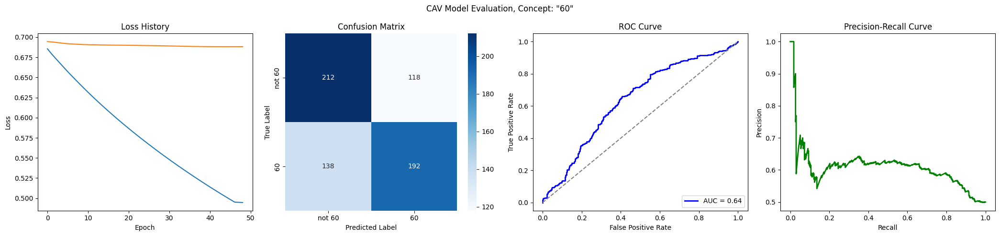

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6110
Epoch 21 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5753
Epoch 31 Validation Loss: 0.6763
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5434
Epoch 41 Validation Loss: 0.6722
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5149
Epoch 51 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4891
Epoch 61 Validation Loss: 0.6681
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

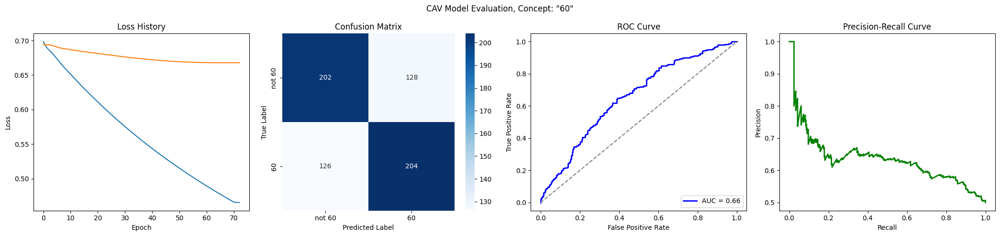

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6358
Epoch 11 Validation Loss: 0.6788
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5883
Epoch 21 Validation Loss: 0.6723
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5474
Epoch 31 Validation Loss: 0.6704
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 38
Loss history saved to trainings/singer_age_decade_60/loss_history.json


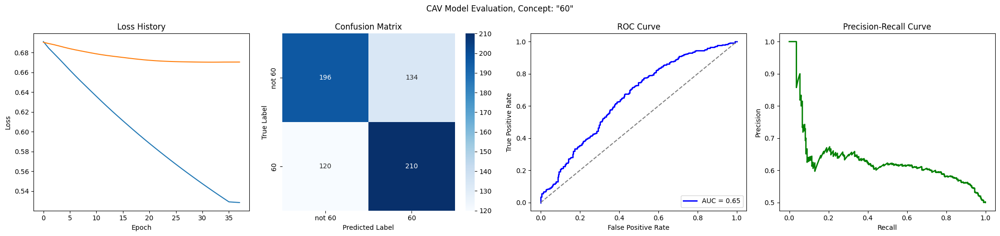

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6155
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5815
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5511
Epoch 41 Validation Loss: 0.6620
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5239
Epoch 51 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4995
Epoch 61 Validation Loss: 0.6585
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

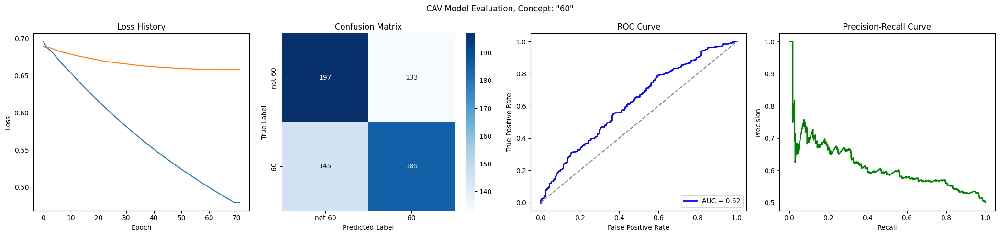

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7092
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6507
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_60/loss_history.json


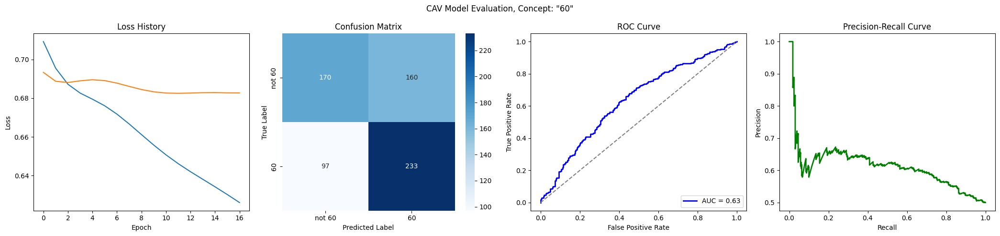

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6437
Epoch 11 Validation Loss: 0.6592
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6042
Epoch 21 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5723
Epoch 31 Validation Loss: 0.6278
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5448
Epoch 41 Validation Loss: 0.6201
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5205
Epoch 51 Validation Loss: 0.6145
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4986
Epoch 61 Validation Loss: 0.6107
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

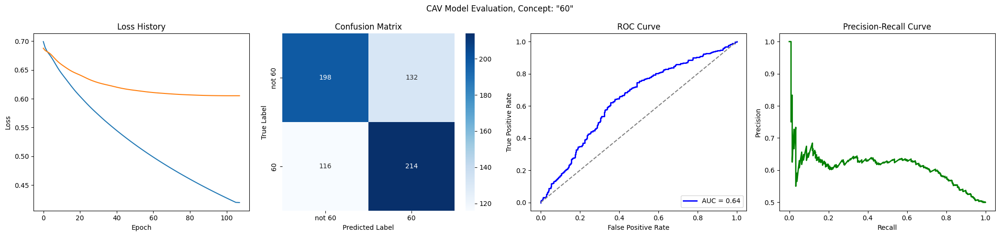

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6248
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5698
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_60/loss_history.json


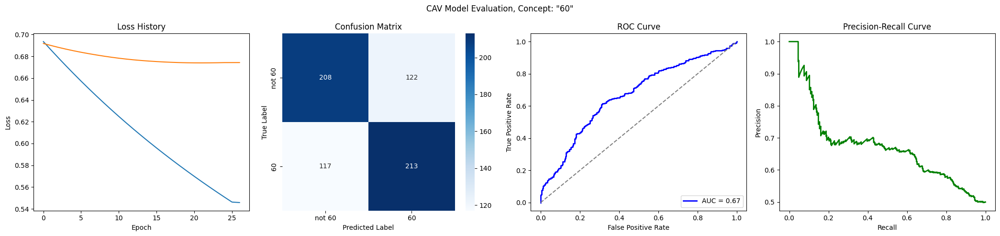

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6800
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6126
Epoch 21 Validation Loss: 0.6755
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_60/loss_history.json


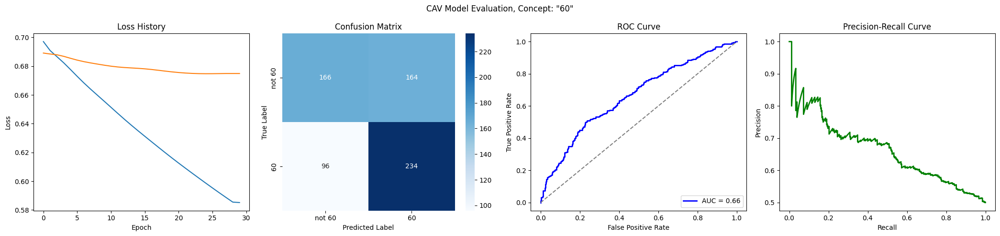

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6444
Epoch 11 Validation Loss: 0.6711
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6020
Epoch 21 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5664
Epoch 31 Validation Loss: 0.6425
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5357
Epoch 41 Validation Loss: 0.6333
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5086
Epoch 51 Validation Loss: 0.6265
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4842
Epoch 61 Validation Loss: 0.6217
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

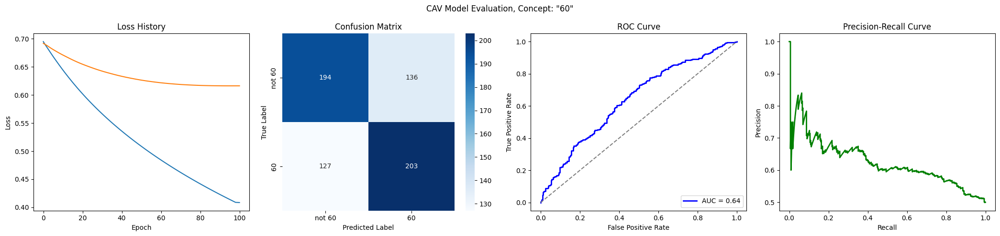

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6331
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5866
Epoch 21 Validation Loss: 0.6699
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5486
Epoch 31 Validation Loss: 0.6590
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5158
Epoch 41 Validation Loss: 0.6472
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4870
Epoch 51 Validation Loss: 0.6361
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4613
Epoch 61 Validation Loss: 0.6269
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

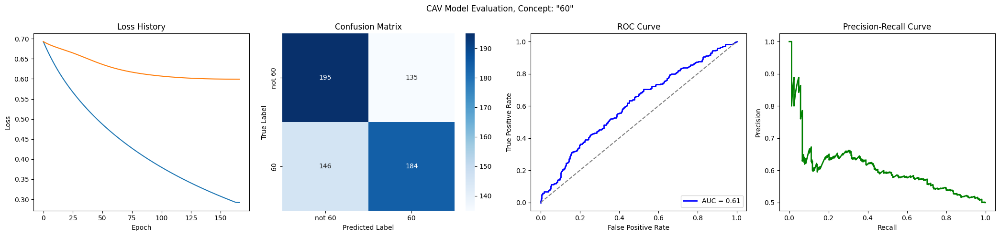

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_60/loss_history.json


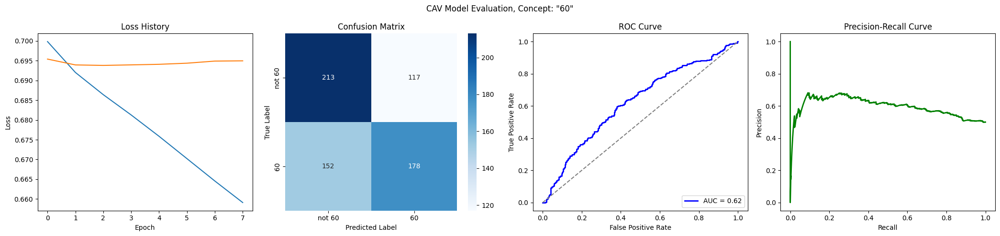

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6450
Epoch 11 Validation Loss: 0.6781
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6021
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5654
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5416
Epoch 41 Validation Loss: 0.6680
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5411
Epoch 51 Validation Loss: 0.6680
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_60/loss_history.json


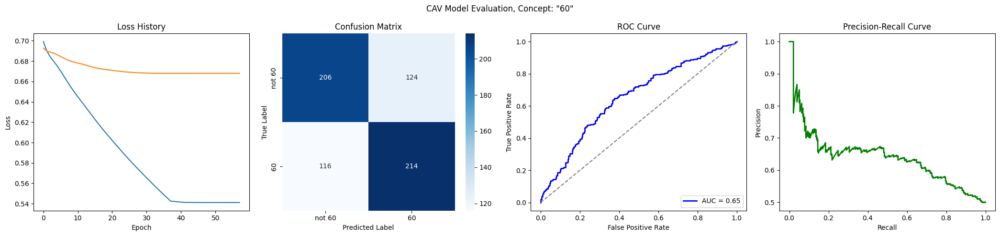

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6420
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5974
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5585
Epoch 31 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/singer_age_decade_60/loss_history.json


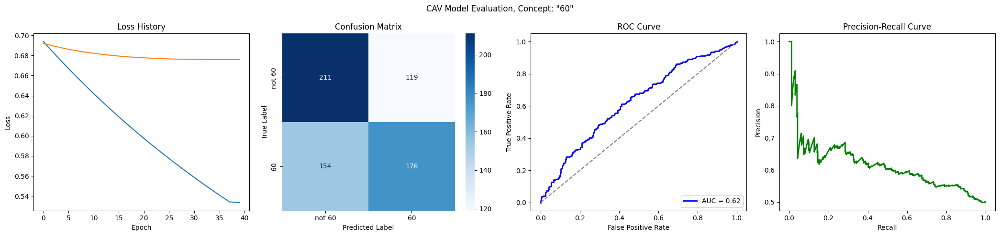

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6409
Epoch 11 Validation Loss: 0.6925
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_60/loss_history.json


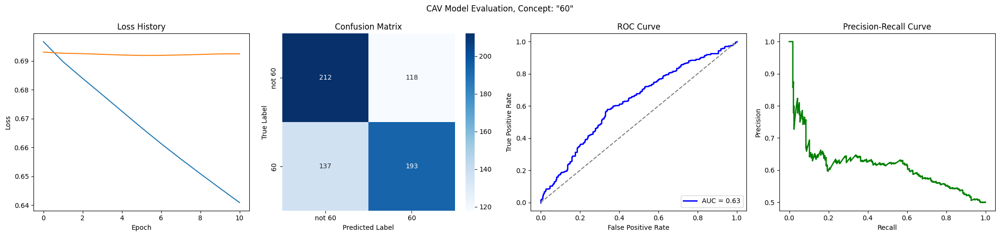

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7072
Epoch 1 Validation Loss: 0.7032
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6335
Epoch 11 Validation Loss: 0.6950
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_60/loss_history.json


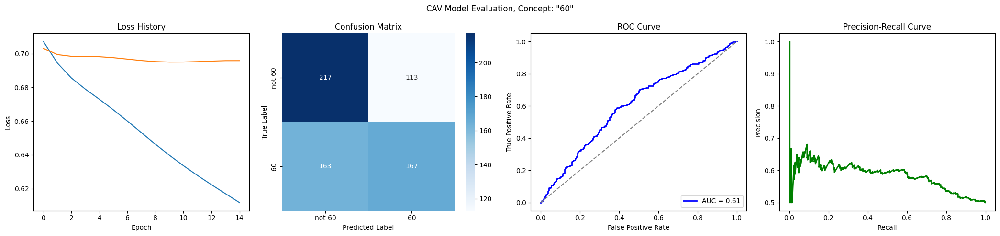

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6970
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6531
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6109
Epoch 21 Validation Loss: 0.6771
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5743
Epoch 31 Validation Loss: 0.6728
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5423
Epoch 41 Validation Loss: 0.6718
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_60/loss_history.json


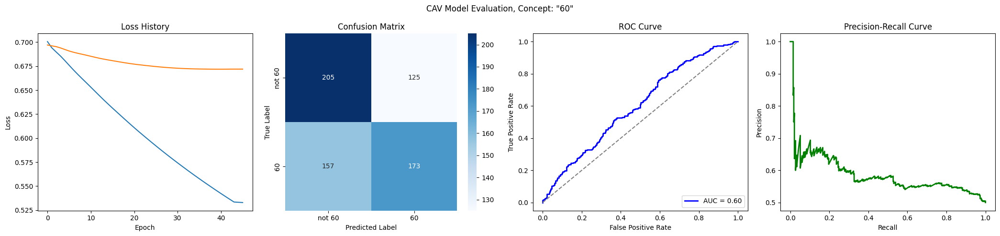

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6474
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6055
Epoch 21 Validation Loss: 0.6818
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5691
Epoch 31 Validation Loss: 0.6808
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5365
Epoch 41 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5069
Epoch 51 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4798
Epoch 61 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

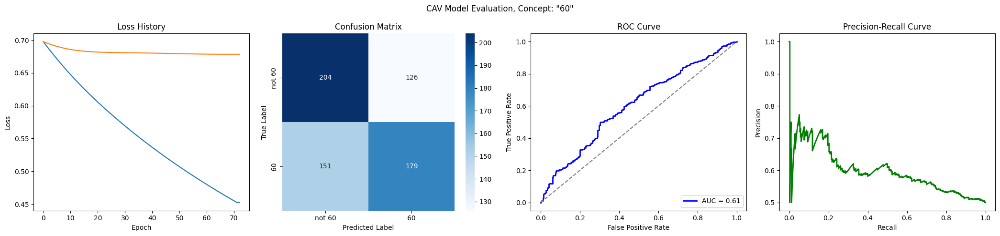

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7047
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6477
Epoch 11 Validation Loss: 0.6717
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6034
Epoch 21 Validation Loss: 0.6575
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5649
Epoch 31 Validation Loss: 0.6484
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5314
Epoch 41 Validation Loss: 0.6447
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5018
Epoch 51 Validation Loss: 0.6433
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_60/loss_history.json


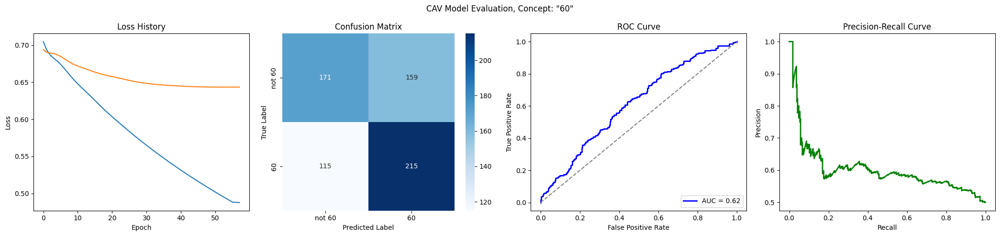

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7017
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6078
Epoch 21 Validation Loss: 0.6889
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_60/loss_history.json


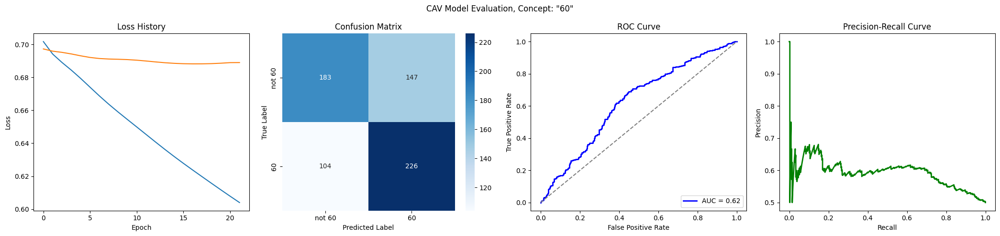

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7065
Epoch 1 Validation Loss: 0.7008
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6555
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6196
Epoch 21 Validation Loss: 0.6717
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5898
Epoch 31 Validation Loss: 0.6692
Early stopping at epoch 35
Loss history saved to trainings/singer_age_decade_60/loss_history.json


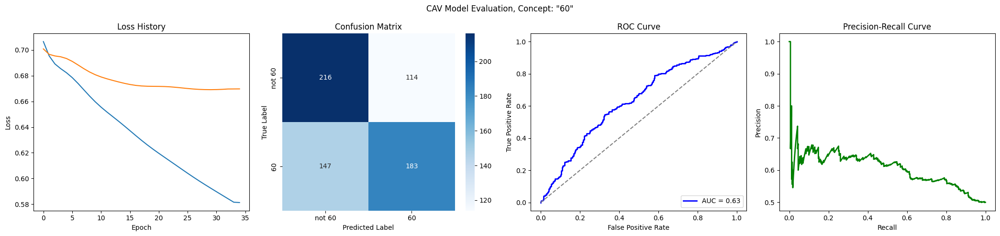

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6898
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6313
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5841
Epoch 21 Validation Loss: 0.6770
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5448
Epoch 31 Validation Loss: 0.6735
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5111
Epoch 41 Validation Loss: 0.6705
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4816
Epoch 51 Validation Loss: 0.6681
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4555
Epoch 61 Validation Loss: 0.6668
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

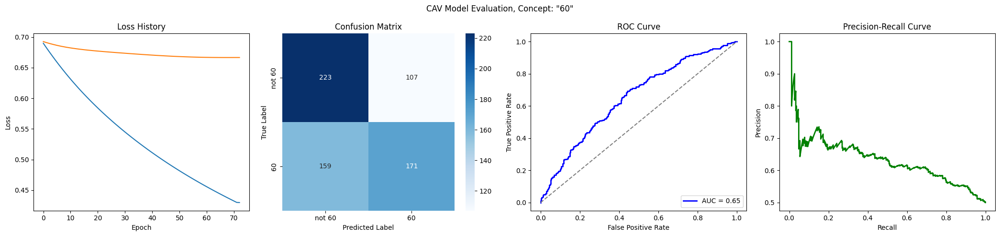

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6419
Epoch 11 Validation Loss: 0.6792
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6014
Epoch 21 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5677
Epoch 31 Validation Loss: 0.6733
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/singer_age_decade_60/loss_history.json


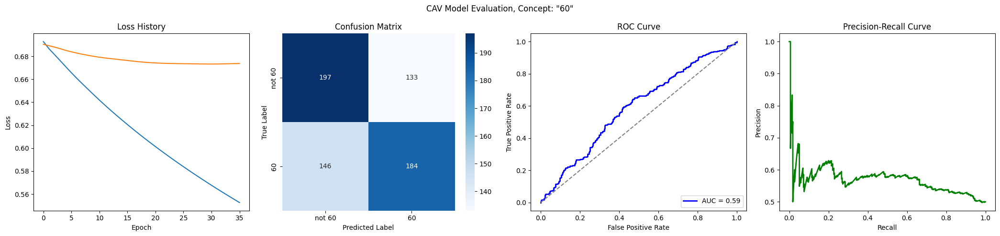

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7042
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6047
Epoch 21 Validation Loss: 0.6742
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_60/loss_history.json


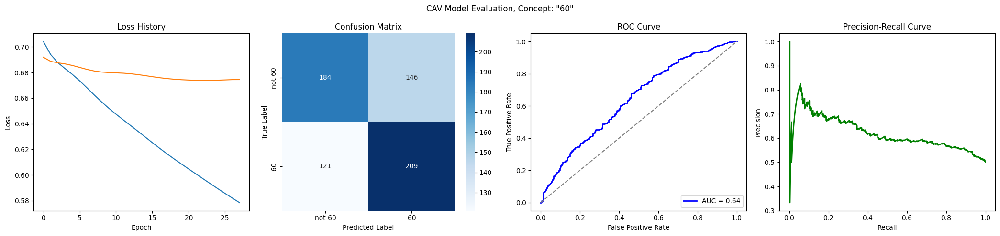

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6306
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5840
Epoch 21 Validation Loss: 0.6778
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_60/loss_history.json


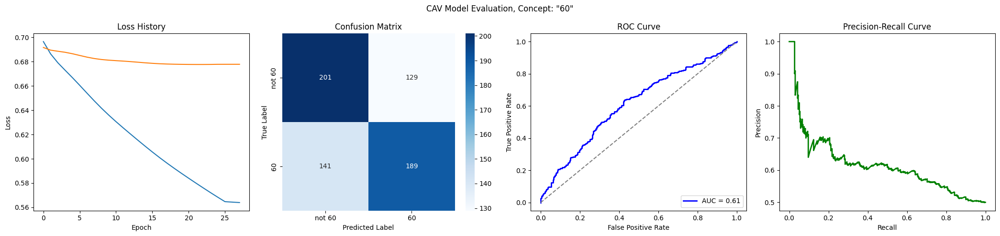

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6421
Epoch 11 Validation Loss: 0.6758
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5986
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5618
Epoch 31 Validation Loss: 0.6674
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_60/loss_history.json


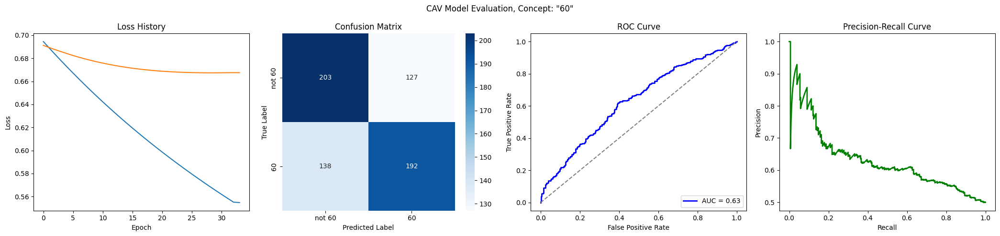

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6380
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5930
Epoch 21 Validation Loss: 0.6607
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5560
Epoch 31 Validation Loss: 0.6517
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5242
Epoch 41 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4962
Epoch 51 Validation Loss: 0.6377
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4712
Epoch 61 Validation Loss: 0.6328
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

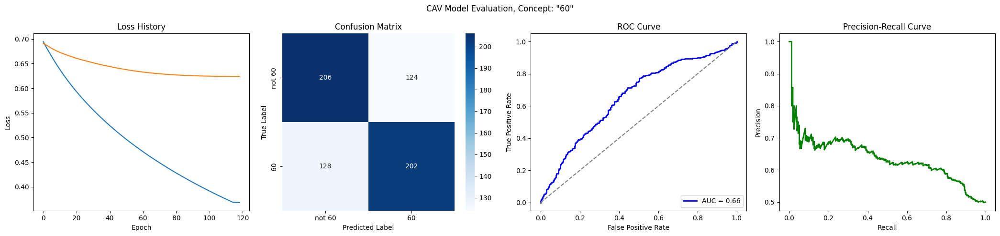

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6415
Epoch 11 Validation Loss: 0.6848
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5992
Epoch 21 Validation Loss: 0.6837
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_60/loss_history.json


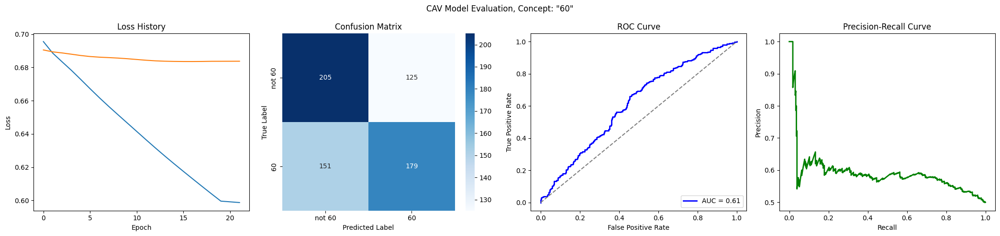

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6494
Epoch 11 Validation Loss: 0.6654
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6112
Epoch 21 Validation Loss: 0.6464
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5776
Epoch 31 Validation Loss: 0.6330
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5472
Epoch 41 Validation Loss: 0.6227
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5197
Epoch 51 Validation Loss: 0.6143
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4945
Epoch 61 Validation Loss: 0.6073
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

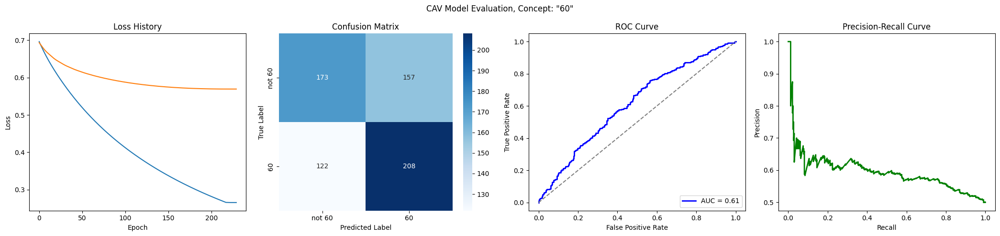

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5945
Epoch 21 Validation Loss: 0.6659
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5573
Epoch 31 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5256
Epoch 41 Validation Loss: 0.6586
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_60/loss_history.json


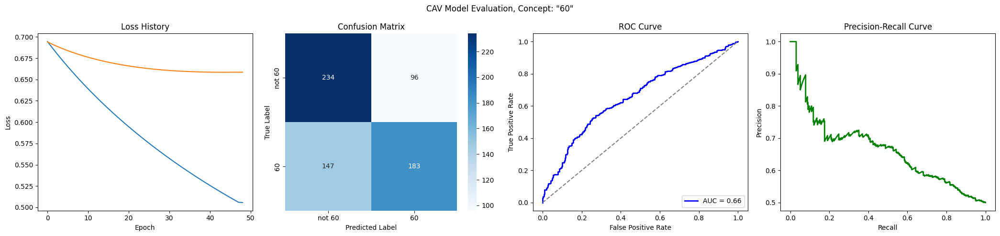

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6917
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6218
Epoch 11 Validation Loss: 0.6710
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5707
Epoch 21 Validation Loss: 0.6617
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5311
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4979
Epoch 41 Validation Loss: 0.6498
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4690
Epoch 51 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4434
Epoch 61 Validation Loss: 0.6394
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

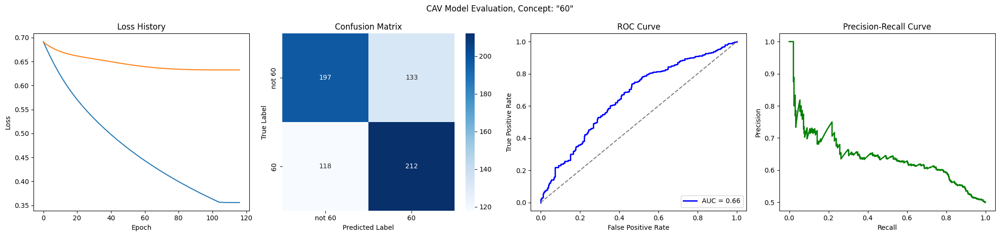

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6391
Epoch 11 Validation Loss: 0.6811
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5944
Epoch 21 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_60/loss_history.json


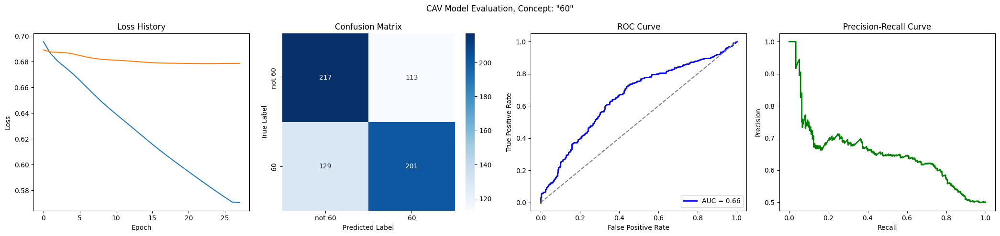

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6496
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6110
Epoch 21 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5771
Epoch 31 Validation Loss: 0.6660
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5471
Epoch 41 Validation Loss: 0.6616
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5200
Epoch 51 Validation Loss: 0.6582
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4955
Epoch 61 Validation Loss: 0.6558
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

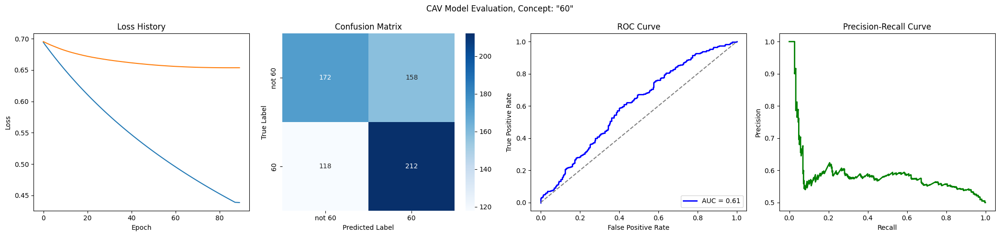

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6330
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5801
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5349
Epoch 31 Validation Loss: 0.6633
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4962
Epoch 41 Validation Loss: 0.6614
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4684
Epoch 51 Validation Loss: 0.6613
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_60/loss_history.json


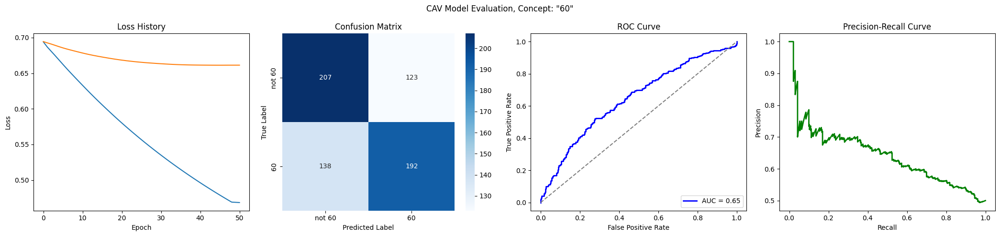

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6889
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6329
Epoch 11 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5853
Epoch 21 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5445
Epoch 31 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5092
Epoch 41 Validation Loss: 0.6901
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_60/loss_history.json


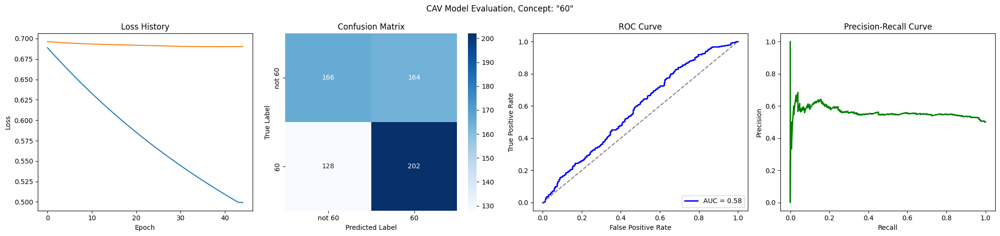

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6481
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6059
Epoch 21 Validation Loss: 0.6701
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5695
Epoch 31 Validation Loss: 0.6647
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5374
Epoch 41 Validation Loss: 0.6622
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5085
Epoch 51 Validation Loss: 0.6616
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5066
Epoch 61 Validation Loss: 0.6616
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

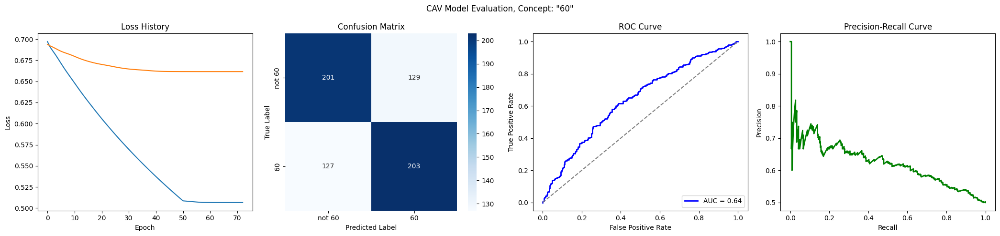

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6350
Epoch 11 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5872
Epoch 21 Validation Loss: 0.6576
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5474
Epoch 31 Validation Loss: 0.6527
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5136
Epoch 41 Validation Loss: 0.6520
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_60/loss_history.json


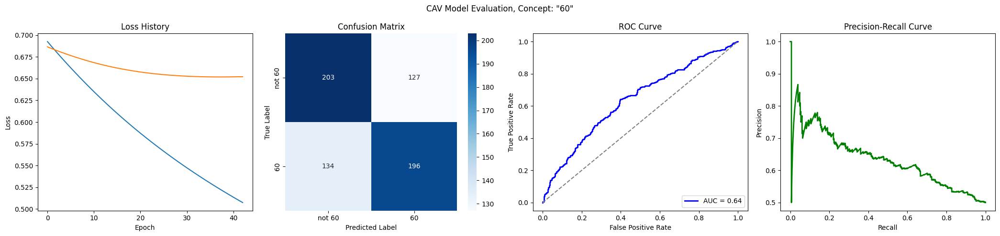

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6422
Epoch 11 Validation Loss: 0.6810
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6011
Epoch 21 Validation Loss: 0.6773
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_60/loss_history.json


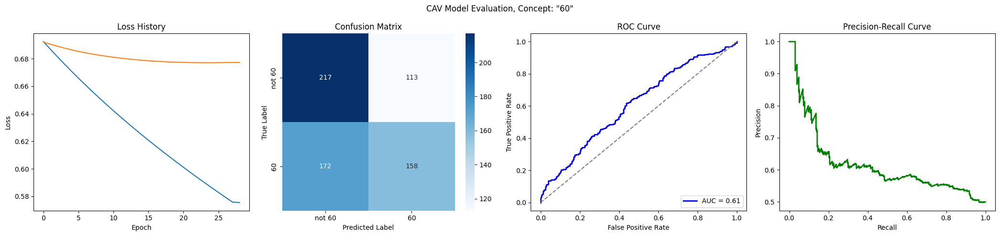

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6310
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_60/loss_history.json


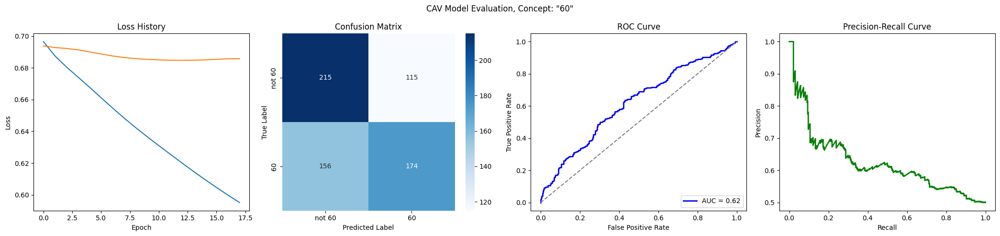

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6962
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_60/loss_history.json


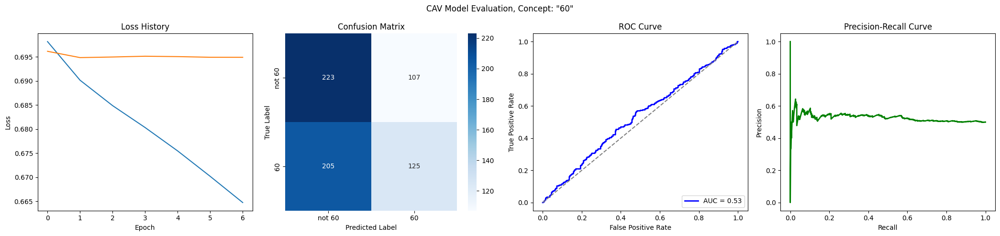

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6500
Epoch 11 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6082
Epoch 21 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5709
Epoch 31 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5409
Epoch 41 Validation Loss: 0.6782
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_60/loss_history.json


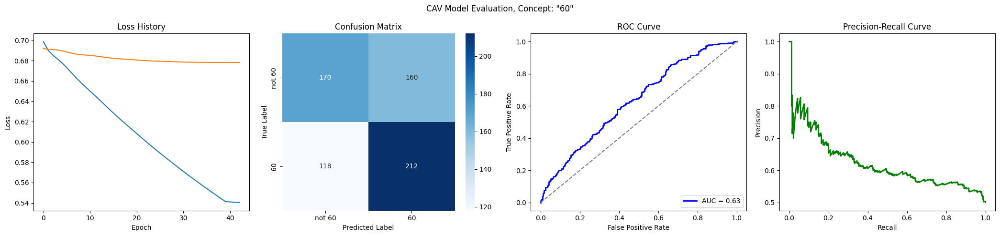

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7000
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6701
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5885
Epoch 31 Validation Loss: 0.6637
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5598
Epoch 41 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5336
Epoch 51 Validation Loss: 0.6572
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5097
Epoch 61 Validation Loss: 0.6553
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

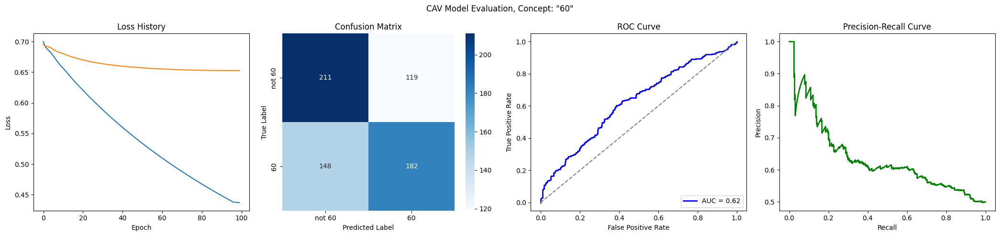

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6117
Epoch 21 Validation Loss: 0.6896
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_60/loss_history.json


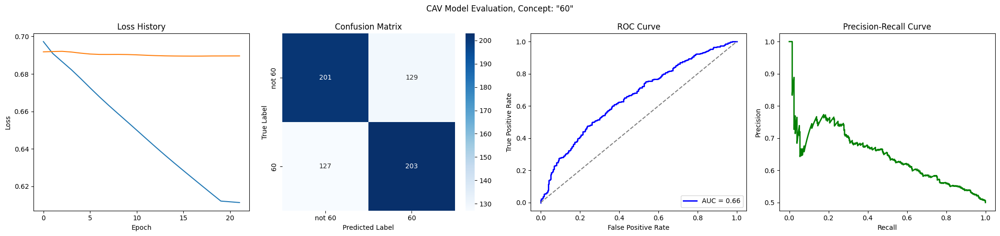

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6399
Epoch 11 Validation Loss: 0.6896
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_60/loss_history.json


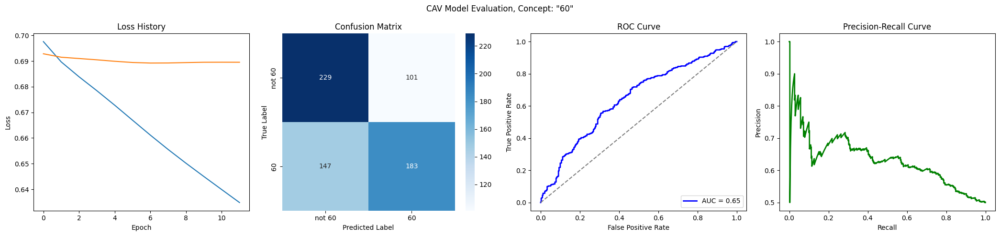

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6947
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_60/loss_history.json


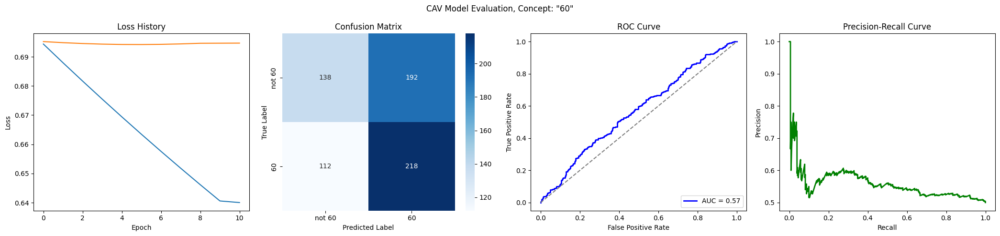

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6385
Epoch 11 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5916
Epoch 21 Validation Loss: 0.6601
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5520
Epoch 31 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5178
Epoch 41 Validation Loss: 0.6493
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4878
Epoch 51 Validation Loss: 0.6469
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4612
Epoch 61 Validation Loss: 0.6462
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 66
Los

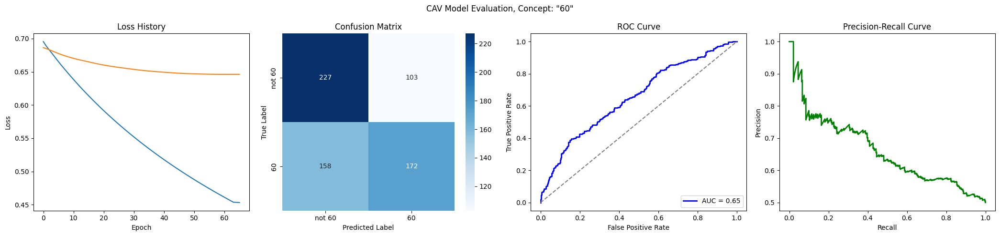

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7189
Epoch 1 Validation Loss: 0.7140
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_60/loss_history.json


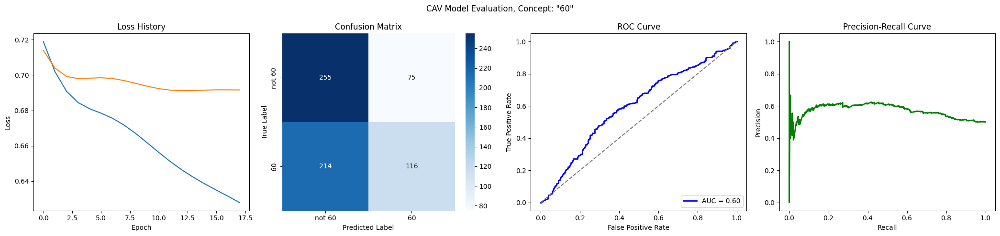

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6374
Epoch 11 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5904
Epoch 21 Validation Loss: 0.6405
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5509
Epoch 31 Validation Loss: 0.6256
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5168
Epoch 41 Validation Loss: 0.6155
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4872
Epoch 51 Validation Loss: 0.6087
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4612
Epoch 61 Validation Loss: 0.6038
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

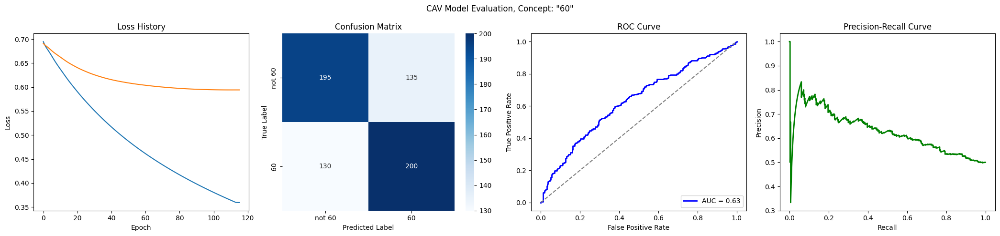

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6911
Epoch 1 Validation Loss: 0.6965
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6096
Epoch 21 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5750
Epoch 31 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5520
Epoch 41 Validation Loss: 0.6884
Early stopping at epoch 41
Loss history saved to trainings/singer_age_decade_60/loss_history.json


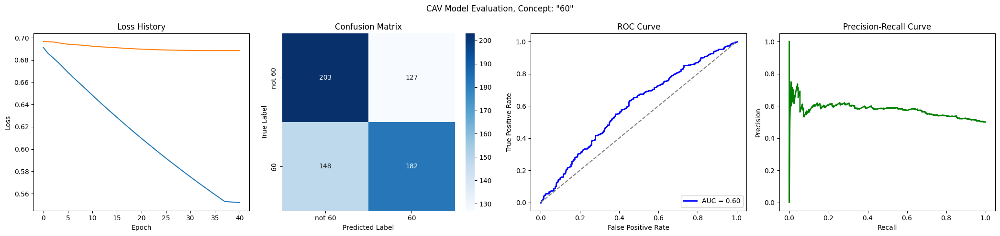

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6392
Epoch 11 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5878
Epoch 21 Validation Loss: 0.6886
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_60/loss_history.json


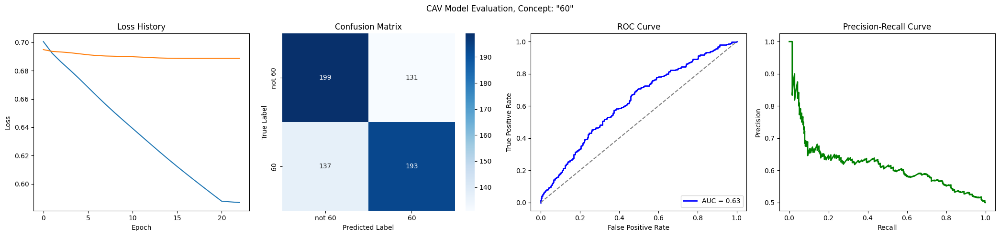

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6315
Epoch 11 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5810
Epoch 21 Validation Loss: 0.6914
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_60/loss_history.json


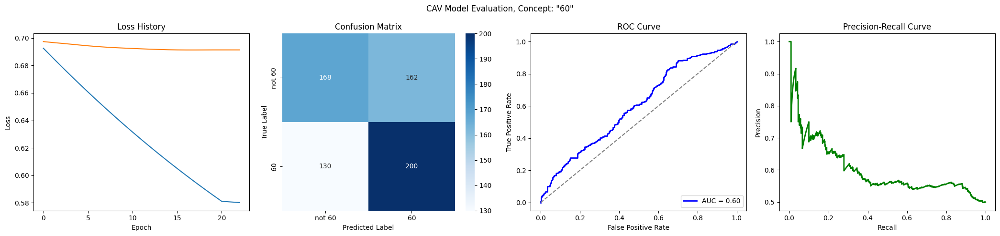

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6394
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5943
Epoch 21 Validation Loss: 0.6619
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5556
Epoch 31 Validation Loss: 0.6520
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5219
Epoch 41 Validation Loss: 0.6457
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4923
Epoch 51 Validation Loss: 0.6426
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4661
Epoch 61 Validation Loss: 0.6418
Early stopping at epoch 65
Loss history saved to trainings/singer_age_decade_60/loss_histor

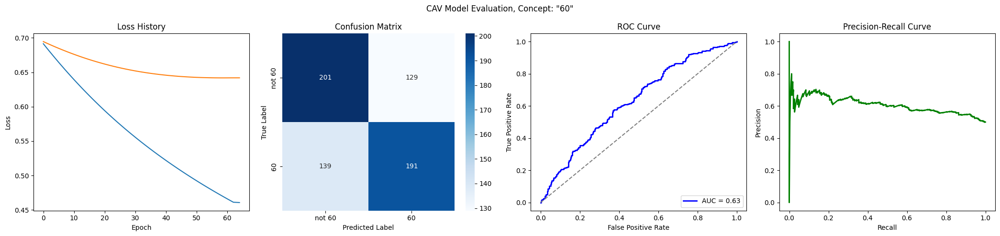

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6898
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6241
Epoch 11 Validation Loss: 0.6799
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5694
Epoch 21 Validation Loss: 0.6765
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_60/loss_history.json


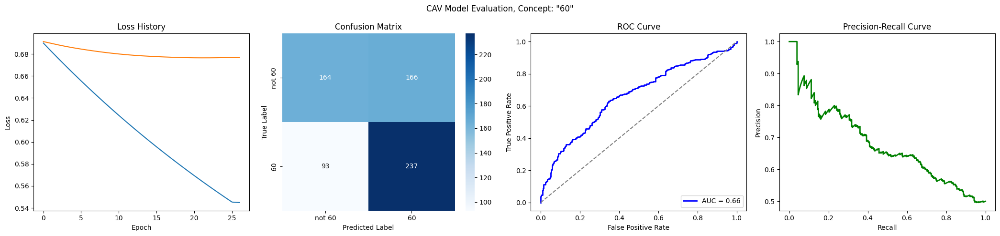

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6457
Epoch 11 Validation Loss: 0.6747
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6024
Epoch 21 Validation Loss: 0.6641
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5649
Epoch 31 Validation Loss: 0.6600
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5321
Epoch 41 Validation Loss: 0.6599
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_60/loss_history.json


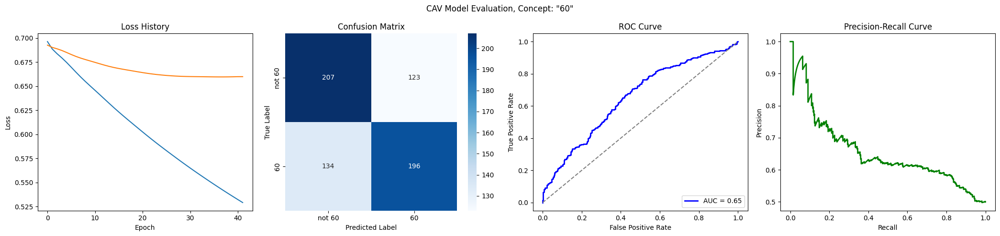

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6910
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6379
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5929
Epoch 21 Validation Loss: 0.6762
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5544
Epoch 31 Validation Loss: 0.6751
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_60/loss_history.json


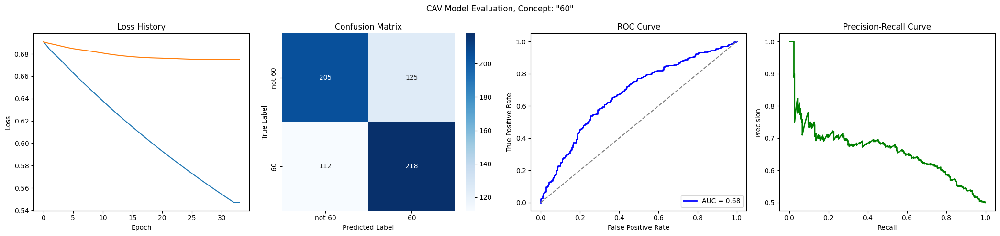

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_60/loss_history.json


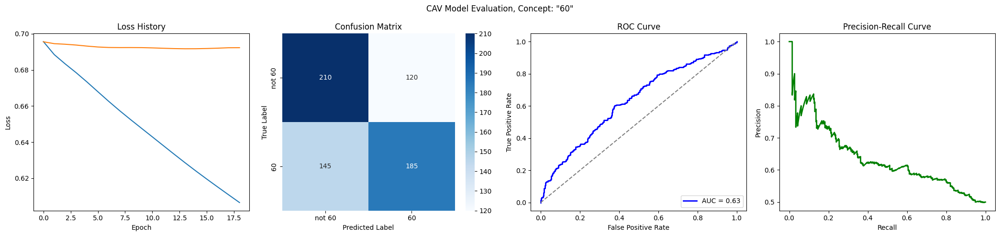

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6855
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6468
Epoch 11 Validation Loss: 0.6741
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6059
Epoch 21 Validation Loss: 0.6686
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5706
Epoch 31 Validation Loss: 0.6683
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_60/loss_history.json


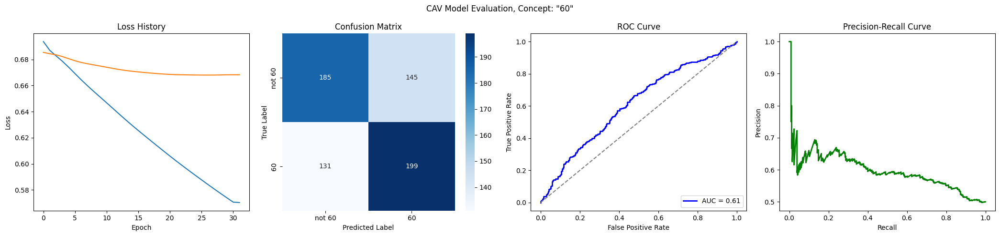

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6959
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6433
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6003
Epoch 21 Validation Loss: 0.6813
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5649
Epoch 31 Validation Loss: 0.6809
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_60/loss_history.json


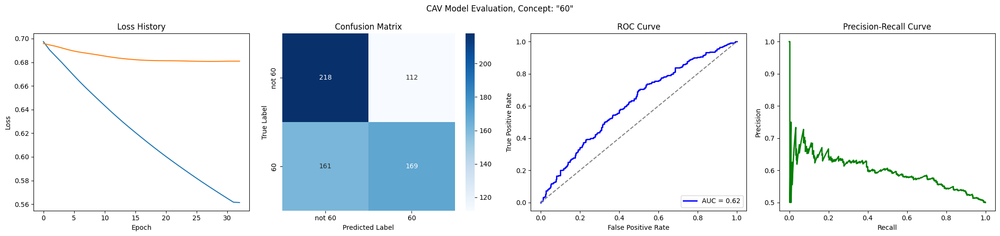

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6426
Epoch 11 Validation Loss: 0.6908
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_60/loss_history.json


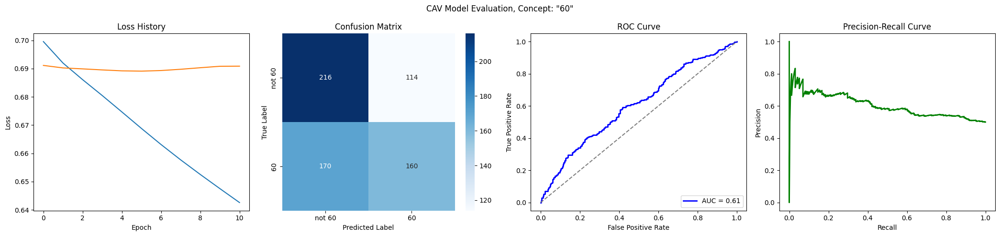

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6444
Epoch 11 Validation Loss: 0.6733
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6014
Epoch 21 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5637
Epoch 31 Validation Loss: 0.6579
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5302
Epoch 41 Validation Loss: 0.6540
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5003
Epoch 51 Validation Loss: 0.6513
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4734
Epoch 61 Validation Loss: 0.6495
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

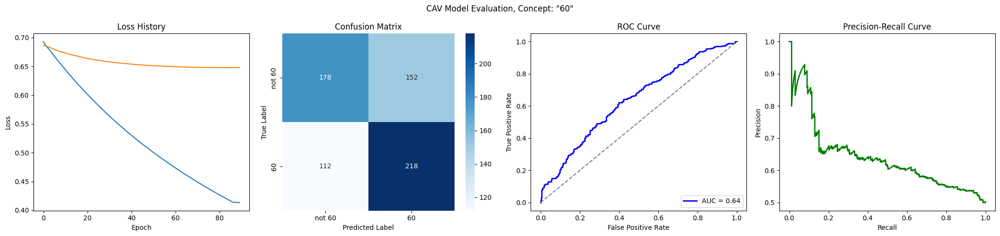

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6309
Epoch 11 Validation Loss: 0.6665
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5817
Epoch 21 Validation Loss: 0.6509
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5426
Epoch 31 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5098
Epoch 41 Validation Loss: 0.6350
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4815
Epoch 51 Validation Loss: 0.6310
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4564
Epoch 61 Validation Loss: 0.6284
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

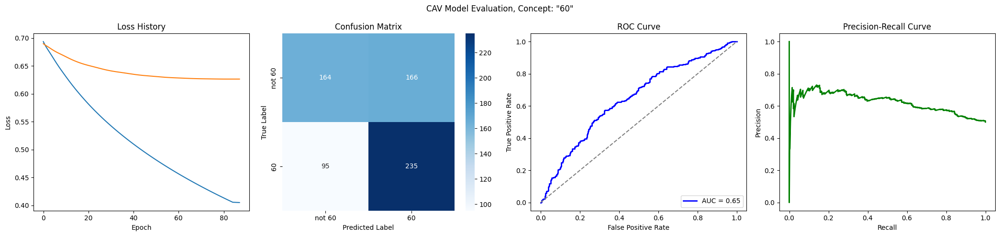

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6899
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6331
Epoch 11 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5841
Epoch 21 Validation Loss: 0.6678
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5427
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5073
Epoch 41 Validation Loss: 0.6572
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4768
Epoch 51 Validation Loss: 0.6531
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4498
Epoch 61 Validation Loss: 0.6494
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

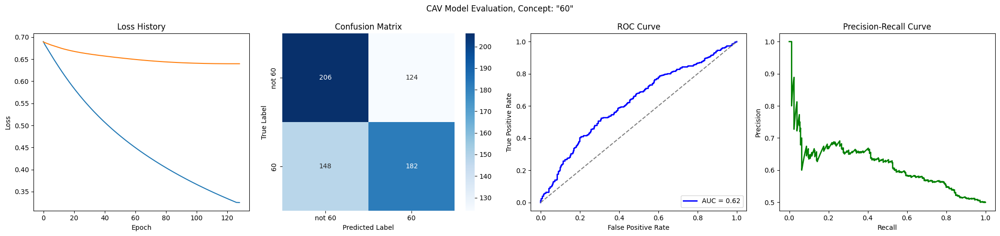

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6453
Epoch 11 Validation Loss: 0.6901
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_60/loss_history.json


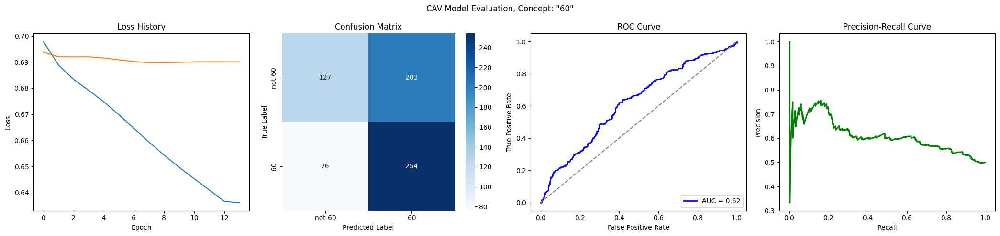

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6281
Epoch 11 Validation Loss: 0.6531
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5778
Epoch 21 Validation Loss: 0.6303
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5370
Epoch 31 Validation Loss: 0.6166
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5025
Epoch 41 Validation Loss: 0.6080
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4729
Epoch 51 Validation Loss: 0.6018
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4470
Epoch 61 Validation Loss: 0.5964
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

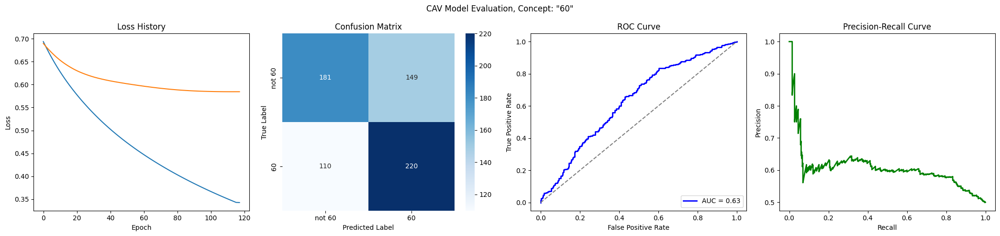

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6160
Epoch 21 Validation Loss: 0.6867
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_60/loss_history.json


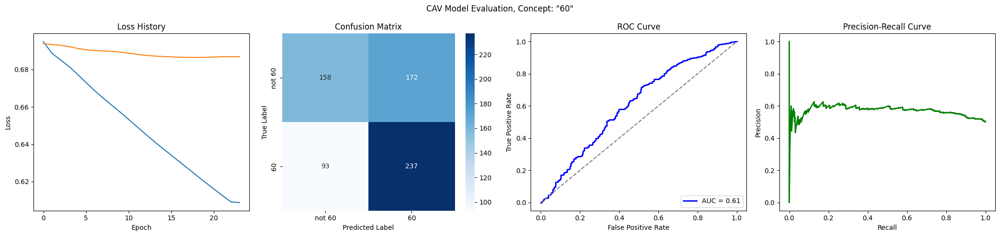

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6325
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5790
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5346
Epoch 31 Validation Loss: 0.6721
Epoch 41/500
Epoch 41 Train Loss: 0.5270
Epoch 41 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5242
Epoch 51 Validation Loss: 0.6719
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_60/loss_history.json


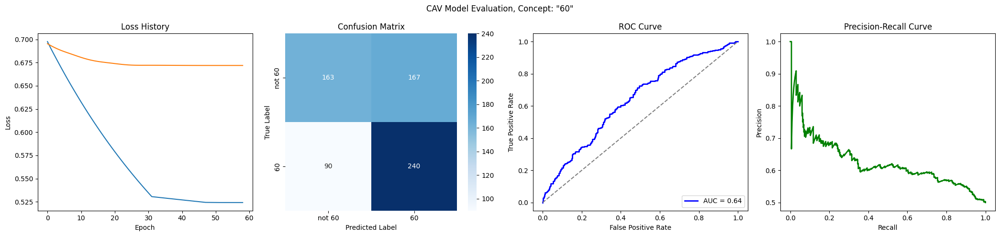

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6903
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5949
Epoch 21 Validation Loss: 0.6620
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5572
Epoch 31 Validation Loss: 0.6557
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5244
Epoch 41 Validation Loss: 0.6531
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4957
Epoch 51 Validation Loss: 0.6525
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_60/loss_history.json


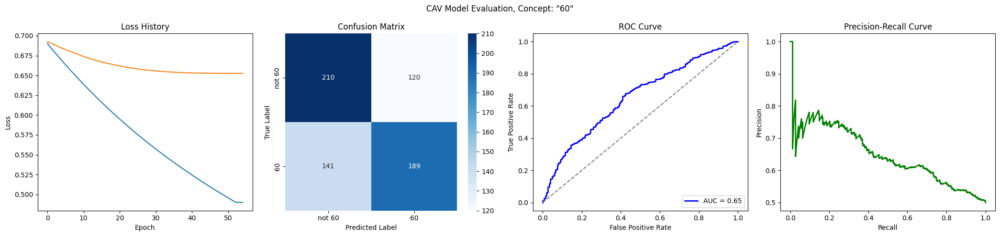

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6363
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5866
Epoch 21 Validation Loss: 0.6700
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5437
Epoch 31 Validation Loss: 0.6628
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5069
Epoch 41 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4751
Epoch 51 Validation Loss: 0.6586
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/singer_age_decade_60/loss_history.json


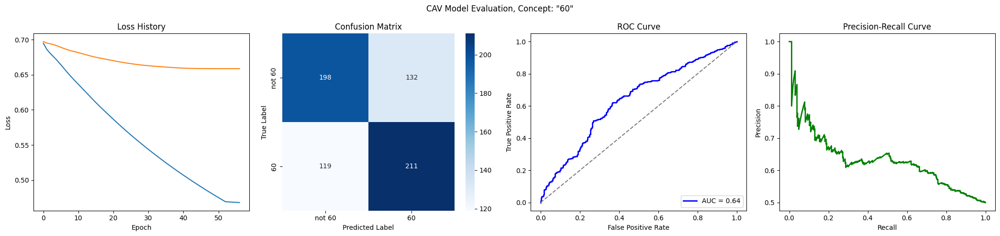

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6330
Epoch 11 Validation Loss: 0.6676
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5830
Epoch 21 Validation Loss: 0.6534
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5414
Epoch 31 Validation Loss: 0.6449
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5063
Epoch 41 Validation Loss: 0.6395
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4760
Epoch 51 Validation Loss: 0.6356
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4494
Epoch 61 Validation Loss: 0.6323
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

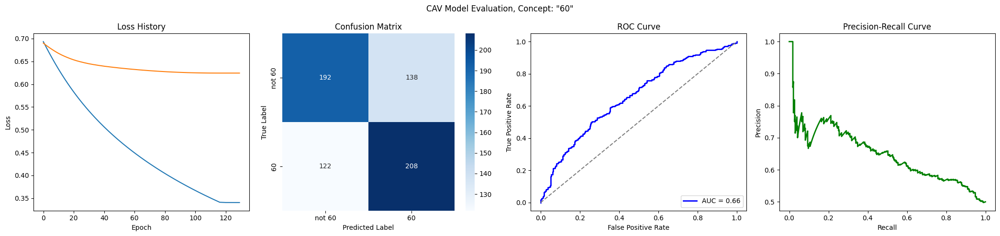

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6474
Epoch 11 Validation Loss: 0.6904
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_60/loss_history.json


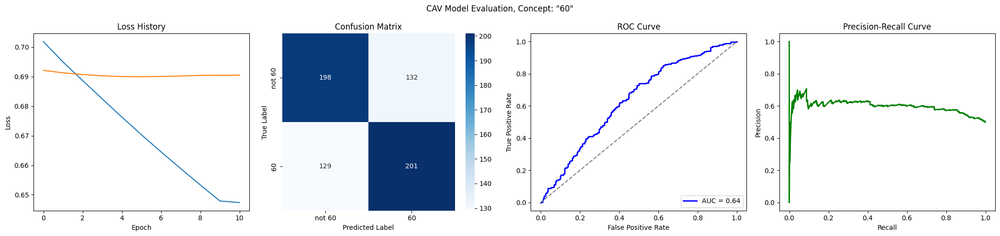

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6894
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6302
Epoch 11 Validation Loss: 0.6517
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5820
Epoch 21 Validation Loss: 0.6263
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5420
Epoch 31 Validation Loss: 0.6086
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5081
Epoch 41 Validation Loss: 0.5963
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4786
Epoch 51 Validation Loss: 0.5880
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4525
Epoch 61 Validation Loss: 0.5827
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

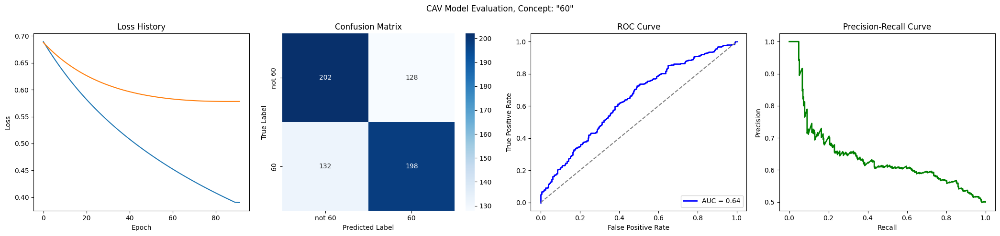

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6185
Epoch 11 Validation Loss: 0.6823
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_60/loss_history.json


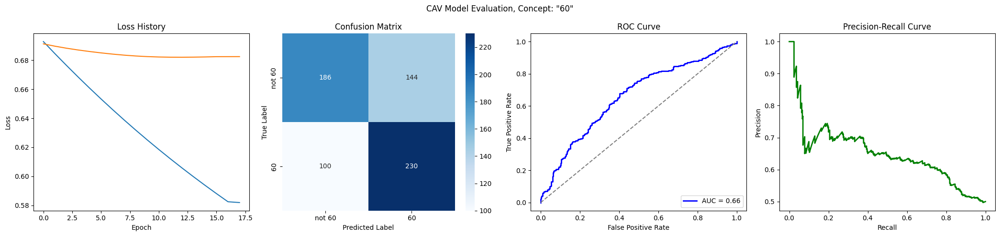

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6324
Epoch 11 Validation Loss: 0.6766
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5856
Epoch 21 Validation Loss: 0.6663
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5474
Epoch 31 Validation Loss: 0.6582
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5146
Epoch 41 Validation Loss: 0.6511
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4860
Epoch 51 Validation Loss: 0.6456
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4606
Epoch 61 Validation Loss: 0.6420
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

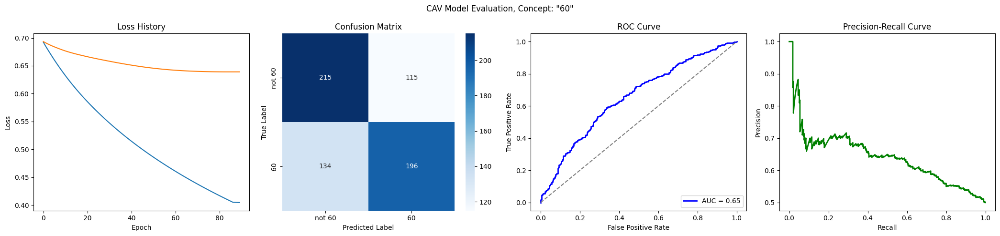

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6360
Epoch 11 Validation Loss: 0.6741
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5879
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5478
Epoch 31 Validation Loss: 0.6544
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5135
Epoch 41 Validation Loss: 0.6498
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4838
Epoch 51 Validation Loss: 0.6478
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/singer_age_decade_60/loss_history.json


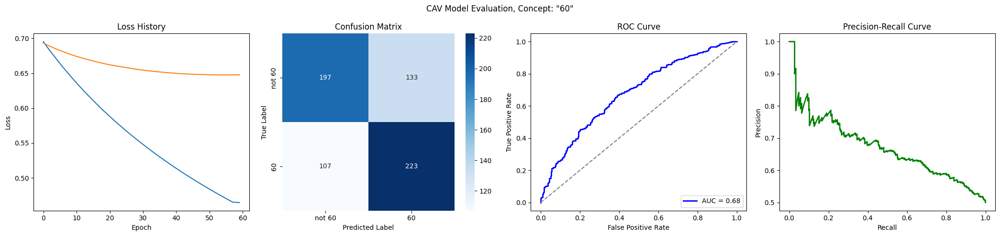

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6075
Epoch 21 Validation Loss: 0.6616
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5721
Epoch 31 Validation Loss: 0.6534
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5413
Epoch 41 Validation Loss: 0.6478
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5140
Epoch 51 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4896
Epoch 61 Validation Loss: 0.6417
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

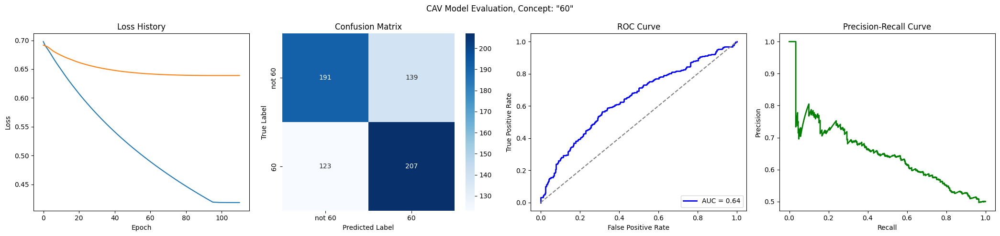

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6321
Epoch 11 Validation Loss: 0.6668
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5804
Epoch 21 Validation Loss: 0.6475
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5384
Epoch 31 Validation Loss: 0.6333
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5037
Epoch 41 Validation Loss: 0.6234
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4741
Epoch 51 Validation Loss: 0.6167
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4482
Epoch 61 Validation Loss: 0.6122
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

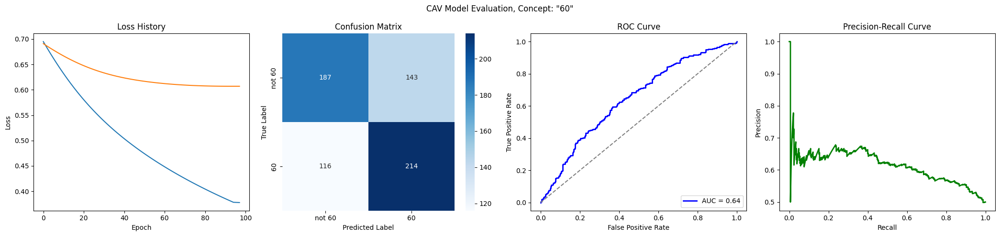

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6156
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5828
Epoch 31 Validation Loss: 0.6592
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5532
Epoch 41 Validation Loss: 0.6500
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5266
Epoch 51 Validation Loss: 0.6423
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5023
Epoch 61 Validation Loss: 0.6362
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

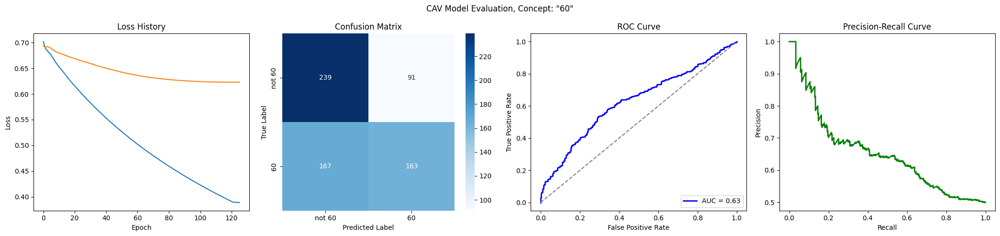

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6824
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5935
Epoch 21 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5536
Epoch 31 Validation Loss: 0.6713
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5190
Epoch 41 Validation Loss: 0.6713
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_60/loss_history.json


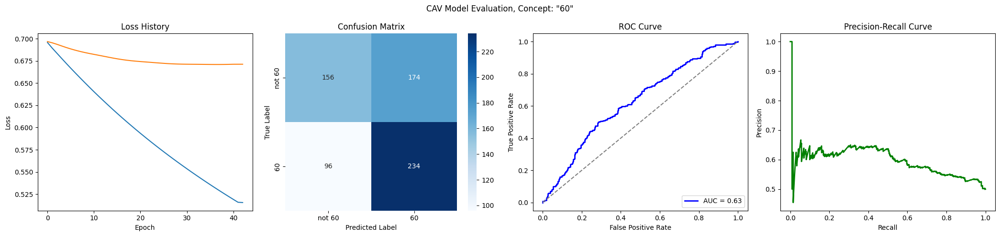

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6888
Epoch 1 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6310
Epoch 11 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5838
Epoch 21 Validation Loss: 0.6541
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5439
Epoch 31 Validation Loss: 0.6519
Early stopping at epoch 35
Loss history saved to trainings/singer_age_decade_60/loss_history.json


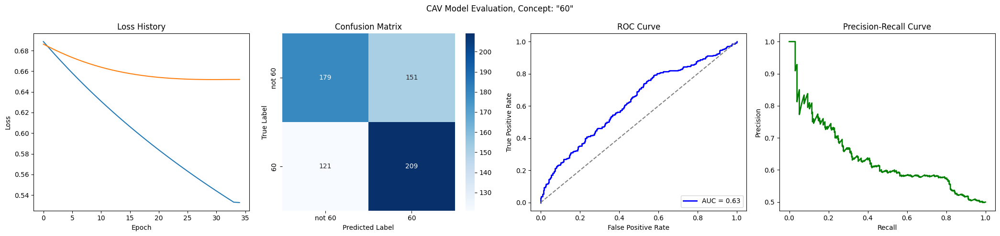

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6875
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6340
Epoch 11 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5890
Epoch 21 Validation Loss: 0.6722
Model saved to trainings/singer_age_decade_60/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_60/loss_history.json


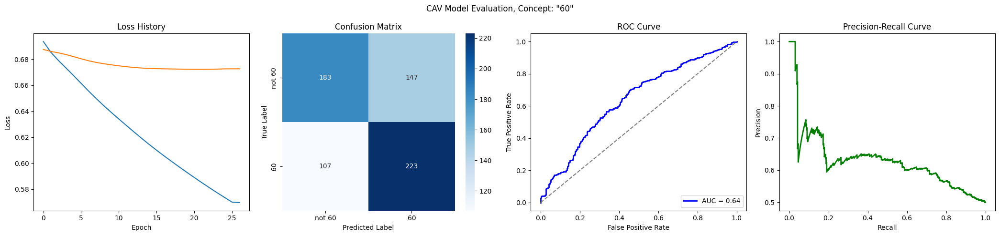

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6287
Epoch 11 Validation Loss: 0.6668
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5770
Epoch 21 Validation Loss: 0.6544
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5343
Epoch 31 Validation Loss: 0.6479
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4983
Epoch 41 Validation Loss: 0.6449
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4673
Epoch 51 Validation Loss: 0.6436
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4402
Epoch 61 Validation Loss: 0.6432
Early stopping at epoch 65
Loss history saved to trainings/singer_age_decade_60/loss_histor

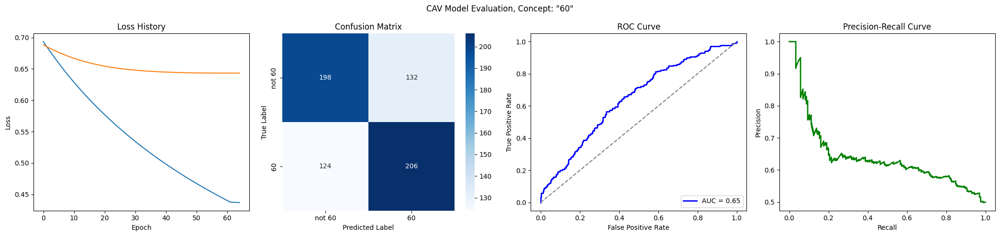

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6874
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6424
Epoch 11 Validation Loss: 0.6514
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5952
Epoch 21 Validation Loss: 0.6276
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5570
Epoch 31 Validation Loss: 0.6139
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5245
Epoch 41 Validation Loss: 0.6060
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4963
Epoch 51 Validation Loss: 0.6018
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4714
Epoch 61 Validation Loss: 0.5997
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 71/500
Epoch 71 Train L

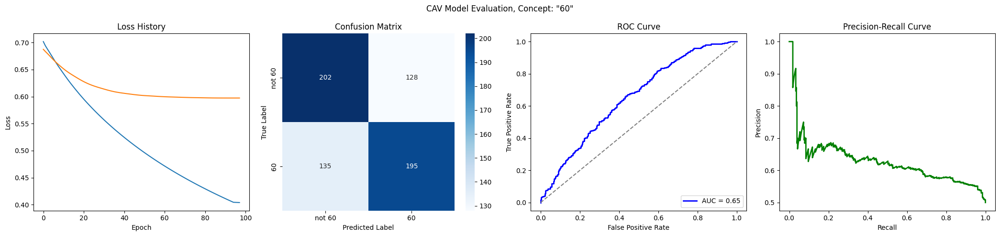

CPU times: user 8min 14s, sys: 4min 58s, total: 13min 13s
Wall time: 45min 19s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

69

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


615 69
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6994
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6205
Epoch 11 Validation Loss: 0.6764
Model saved to trainings/singer_age_decade_60/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5839
Epoch 21 Validation Loss: 0.6755
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_60/loss_history.json


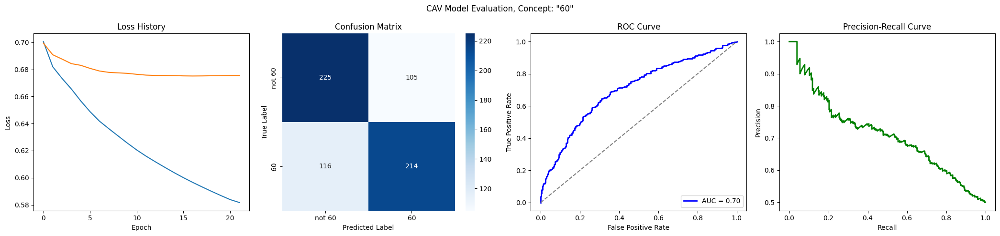

In [13]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
